In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import glob
import cv2

from tqdm import tqdm_notebook as tqdm
import matplotlib.image as mpimg

import plotly.graph_objects as go

In [ ]:
train_df = pd.read_csv('/kaggle/input/landmark-recognition-2021/train.csv')

test_list = glob.glob('/kaggle/input/landmark-recognition-2021/test/*/*/*/*')
train_list= glob.glob('/kaggle/input/landmark-recognition-2021/train/*/*/*/*')

landmark_info = pd.read_csv('/kaggle/input/mappings-gldv2/train_label_to_category.csv')

In [ ]:
print(landmark_info[['landmark_id', 'category']].head())

In [97]:
landmark_info.to_csv('train_label_to_hierarchical_modified.csv', index=False)

In [94]:
landmark_info['landmark_id'] = landmark_info['landmark_id'] + 1

In [98]:
landmark_info_modified = pd.read_csv('/kaggle/working/train_label_to_hierarchical_modified.csv')

# ***Training Set*** #

In [65]:
print("Train data shape -  rows:",train_df.shape[0]," columns:", train_df.shape[1])

Train data shape -  rows: 1580470  columns: 2


In [8]:
train_df.head()

,id,landmark_id
0,17660ef415d37059,1
1,92b6290d571448f6,1
2,cd41bf948edc0340,1
3,fb09f1e98c6d2f70,1
4,25c9dfc7ea69838d,7


In [9]:
landmark_counts = train_df['landmark_id'].value_counts().head(50)
landmark_counts_least = train_df['landmark_id'].value_counts().tail(50)

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


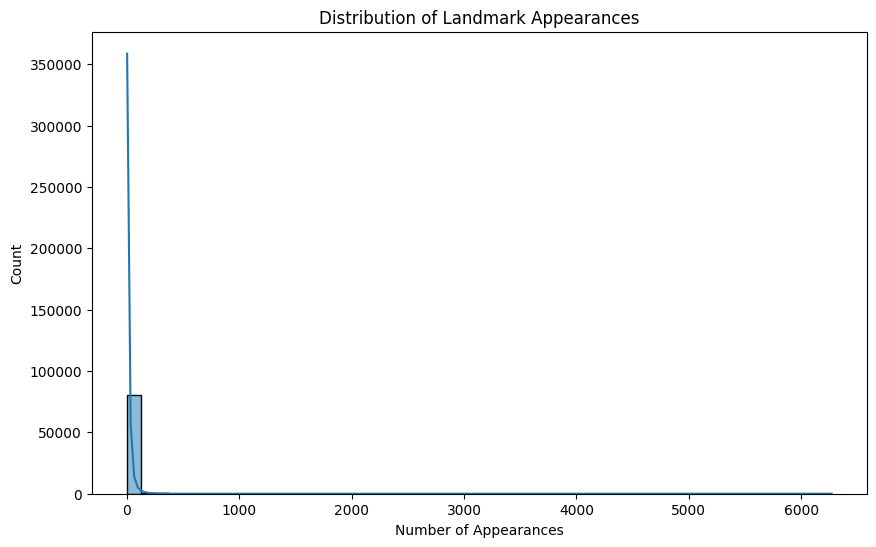

In [17]:
plt.figure(figsize=(10, 6))
sns.histplot(train_df['landmark_id'].value_counts(), bins=50, kde=True)
plt.title('Distribution of Landmark Appearances')
plt.xlabel('Number of Appearances')
plt.ylabel('Count')
plt.show()

From the chart above, it can be seen that most landmarks fall on to the left sided tail, which means
=> Most landmarks only have a few images.

[Text(0.5, 0, 'Landmarks'), Text(0, 0.5, 'Number of images')]

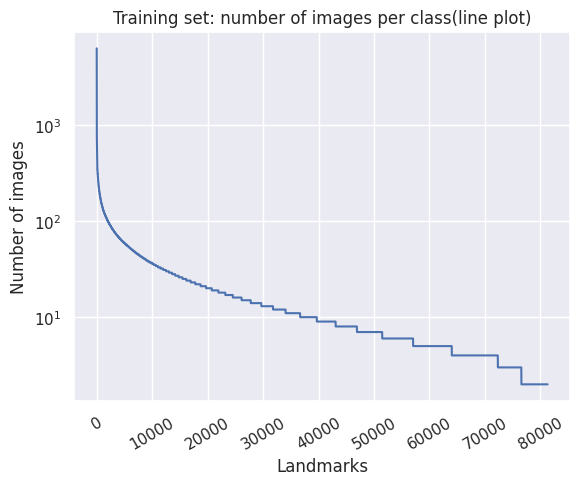

In [22]:
sns.set()
plt.title('Training set: number of images per class(line plot)')
landmarks_fold = pd.DataFrame(train_df['landmark_id'].value_counts())
landmarks_fold.reset_index(inplace=True)
landmarks_fold.columns = ['landmark_id','count']
ax = landmarks_fold['count'].plot(logy=True, grid=True)
locs, labels = plt.xticks()
plt.setp(labels, rotation=30)
ax.set(xlabel="Landmarks", ylabel="Number of images")

<ipython-input-24-ed1cff136141>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(train_df['landmark_id'], color="tomato", shade=True)
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


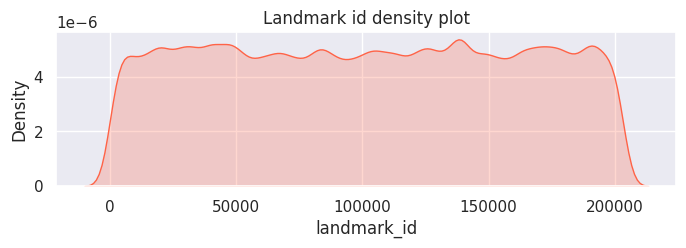

In [24]:
plt.figure(figsize = (8, 2))
plt.title('Landmark id density plot')
sns.kdeplot(train_df['landmark_id'], color="tomato", shade=True)
plt.show()

## Show some random images in the train set ##

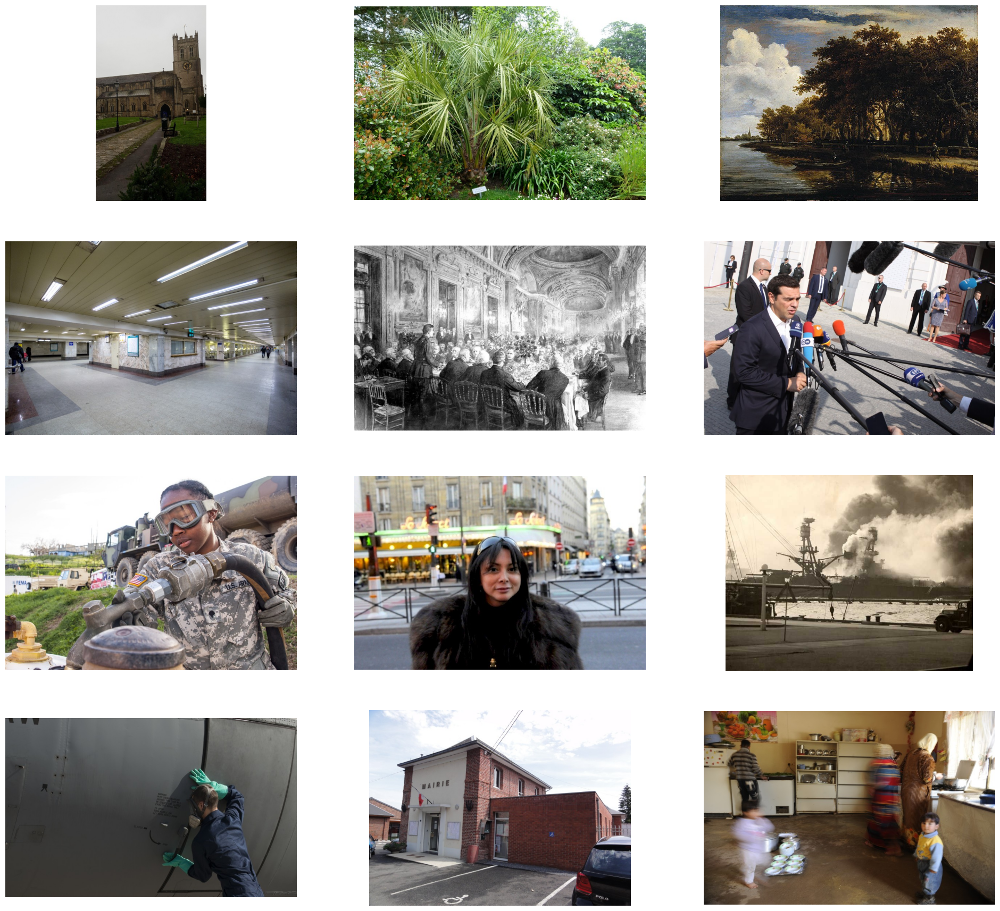

In [41]:
num_images = min(12, len(test_list))

plt.rcParams["axes.grid"] = False
f, axarr = plt.subplots(4, 3, figsize=(24, 22))

curr_row = 0
for i in range(num_images):  # Loop over the number of images, up to 12 or length of the list
    example = cv2.imread(test_list[i])
    example = example[:,:,::-1]  
    
    col = i % 3 
    axarr[curr_row, col].imshow(example)
    axarr[curr_row, col].axis('off')  # Hide axes for cleaner images
    
    if col == 2:  # Move to next row after 3 columns
        curr_row += 1

plt.show()

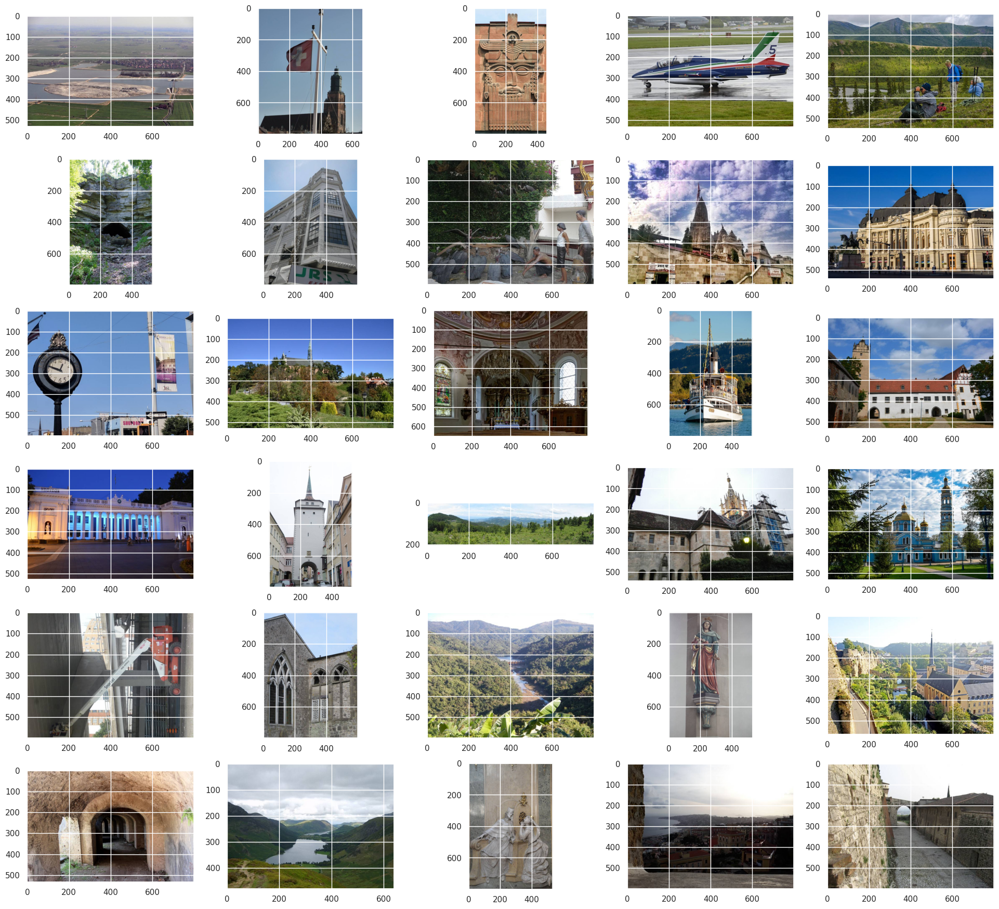

In [42]:
plt.rcParams["axes.grid"] = True
f, axarr = plt.subplots(6, 5, figsize=(24, 22))

curr_row = 0
for i in range(30):
    example = cv2.imread(train_list[i])
    example = example[:,:,::-1]
    
    col = i%6
    axarr[col, curr_row].imshow(example)
    if col == 5:
        curr_row += 1

In [103]:
missing_landmark_ids = train_df[~train_df['landmark_id'].isin(landmark_info['landmark_id'])]

# Count how many unique landmark_id values are missing
missing_landmark_count = missing_landmark_ids['landmark_id'].nunique()

print("Total number of missing landmark IDs:", missing_landmark_count)

Total number of missing landmark IDs: 0


Top 10, top 50, top 100 landmarks with the highest appearances count

In [28]:
temp = pd.DataFrame(train_df.landmark_id.value_counts().head(10))
temp.reset_index(inplace=True)
temp.columns = ['landmark_id', 'count']
temp

,landmark_id,count
0,138982,6272
1,126637,2231
2,20409,1758
3,83144,1741
4,113209,1135
5,177870,1088
6,194914,1073
7,149980,971
8,139894,966
9,1924,944


In [79]:
temp = pd.DataFrame(train_df.landmark_id.value_counts().head(50))
temp.reset_index(inplace=True)
temp.columns = ['landmark_id','count']
temp

,landmark_id,count
0,138982,6272
1,126637,2231
2,20409,1758
3,83144,1741
4,113209,1135
5,177870,1088
6,194914,1073
7,149980,971
8,139894,966
9,1924,944


In [146]:
temp = pd.DataFrame(train_df.landmark_id.value_counts().head(100))
temp.reset_index(inplace=True)
temp.columns = ['landmark_id', 'count']

# Define the chunk size
chunk_size = 50

# Print the data in chunks
for start in range(50, len(temp), chunk_size):
    end = min(start + chunk_size, len(temp))  # To ensure we don't go out of bounds
    print(f"Showing rows {start} to {end - 1}:")
    print(temp.iloc[start:end])
    print("\n" + "="*50 + "\n")  # Se

Showing rows 50 to 99:
    landmark_id  count
50        85633    502
51        19605    492
52        28139    486
53       132969    485
54       115821    482
55       147897    479
56        73300    477
57       107801    474
58        80272    473
59        29794    463
60       171683    460
61       199450    459
62       137203    456
63        39865    452
64        31361    449
65        51272    437
66       165900    429
67       190956    428
68        15445    428
69       201840    427
70        98993    427
71       136302    426
72        70644    425
73       103899    423
74        28641    418
75       195412    413
76       180901    413
77        70088    409
78       194406    408
79        38494    402
80       172929    400
81       110153    398
82        44939    396
83       168106    394
84       177409    393
85        67406    390
86        75005    387
87       164191    386
88        20064    384
89        86869    381
90       125786    379
91       19

The corresponding top 50 landmarks with their url 

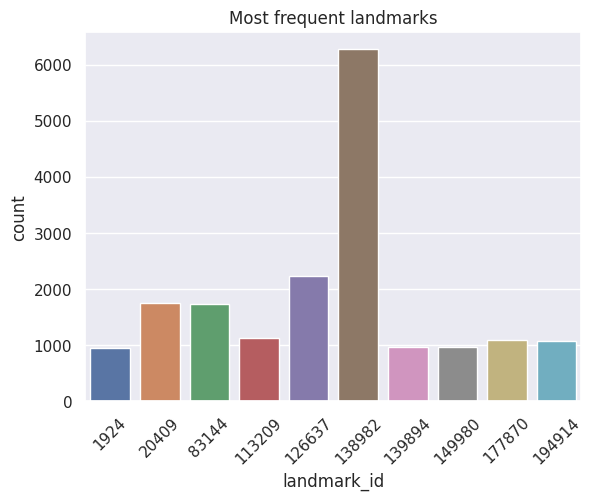

In [29]:
sns.set()
# plt.figure(figsize=(9, 8))
plt.title('Most frequent landmarks')
sns.set_color_codes("pastel")
sns.barplot(x="landmark_id", y="count", data=temp,
            label="Count")
locs, labels = plt.xticks()
plt.setp(labels, rotation=45)
plt.show()

In [99]:
pd.set_option('display.max_colwidth', None) 
merged_data = pd.merge(temp, landmark_info_modified, on='landmark_id', how='left')

In [100]:
print(merged_data[['landmark_id', 'category']])

    landmark_id  \
0        138982   
1        126637   
2         20409   
3         83144   
4        113209   
5        177870   
6        194914   
7        149980   
8        139894   
9          1924   
10       176528   
11         9070   
12        46705   
13       168098   
14        20120   
15       161902   
16        36748   
17       120734   
18       176018   
19        10419   
20        45428   
21        14915   
22        41648   
23       165596   
24        47378   
25       187779   
26        38482   
27        40088   
28        25093   
29       162833   
30       173511   
31       189907   
32       190822   
33        76303   
34       191292   
35       109169   
36        51856   
37       192931   
38        41808   
39       107164   
40       189811   
41       101399   
42        64792   
43        80177   
44        27190   
45       152708   
46       143710   
47        31531   
48           27   
49       113838   

                              

In [101]:
print(landmark_info['landmark_id'].nunique())
print(train_df['landmark_id'].nunique())

203094
81313


In [102]:
missing_landmark_ids = train_df[~train_df['landmark_id'].isin(landmark_info_1['landmark_id'])]

print("Missing Landmark IDs in Metadata:")
print(missing_landmark_ids[['id', 'landmark_id']])

Missing Landmark IDs in Metadata:
Empty DataFrame
Columns: [id, landmark_id]
Index: []


In [105]:
landmark_id_to_search = 138982
result = landmark_info[landmark_info['landmark_id'] == landmark_id_to_search]

# Display the result
print(result)

        landmark_id  \
138981       138982   

                                                                          category  
138981  http://commons.wikimedia.org/wiki/Category:St._Laurentius_(Oberdollendorf)  


In [90]:
landmark_id_to_search = 1924
count_images = train_df[train_df['landmark_id'] == landmark_id_to_search].shape[0]

# Display the count
print(f"Number of images with landmark_id {landmark_id_to_search}: {count_images}")

Number of images with landmark_id 1924: 944


## Display the images of the landmark_id ##

        landmark_id  \
138981       138982   

                                                                          category  
138981  http://commons.wikimedia.org/wiki/Category:St._Laurentius_(Oberdollendorf)  


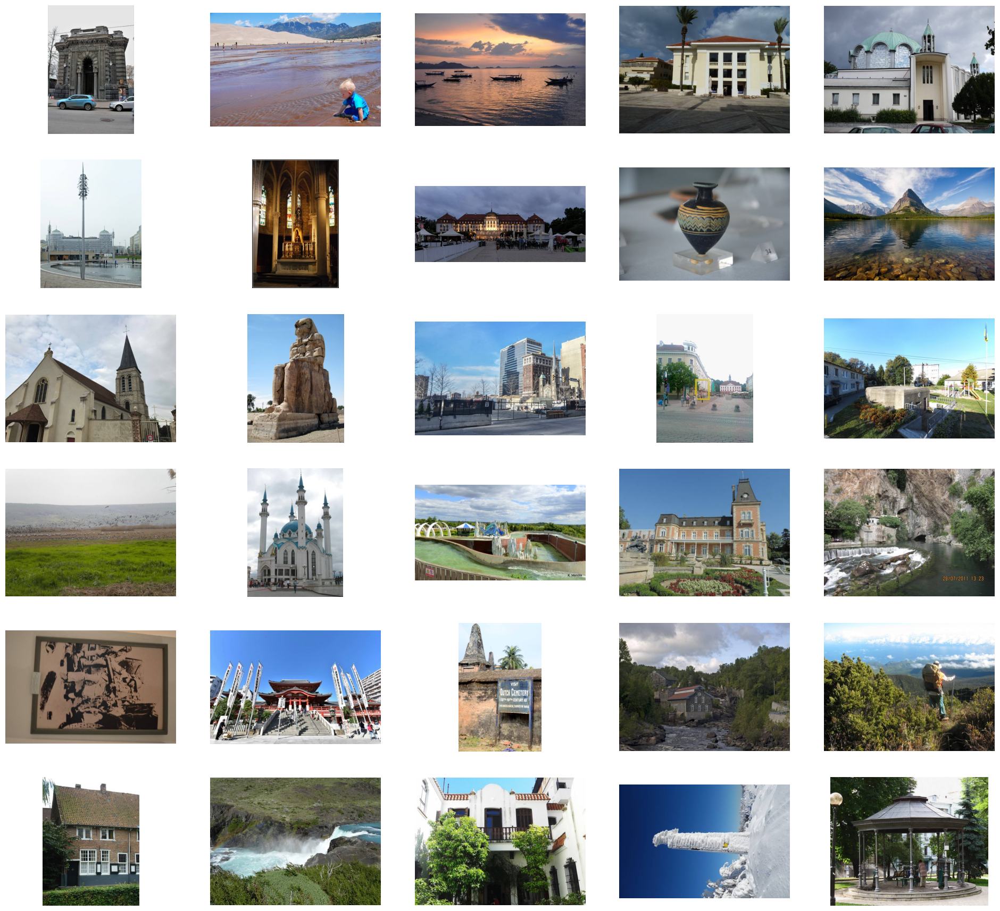

In [106]:
landmark_id_to_search = 138982
image_ids_with_landmark = train_df[train_df['landmark_id'] == landmark_id_to_search]['id'].tolist()
result = landmark_info[landmark_info['landmark_id'] == landmark_id_to_search]

# Display the result
print(result)

image_paths_to_display = [train_list[i] for i in range(len(train_list)) if train_df['id'][i] in image_ids_with_landmark]

# Set up the plot to display images
plt.rcParams["axes.grid"] = True
f, axarr = plt.subplots(6, 5, figsize=(24, 22))

curr_row = 0
num_images_to_display = min(30, len(image_paths_to_display))  # Display at most 30 images, if available

for i in range(num_images_to_display):
    # Read the image (make sure to read the correct path)
    example = cv2.imread(image_paths_to_display[i])
    example = cv2.cvtColor(example, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for matplotlib
    
    # Calculate row and column position in the subplot grid
    col = i % 5  # 5 columns
    axarr[curr_row, col].imshow(example)
    axarr[curr_row, col].axis('off')  # Turn off axis for better visualization
    
    # Move to the next row after 5 images
    if col == 4:
        curr_row += 1

# Show the plot with the images
plt.show()

In [93]:
landmark_id_0_rows = train_df[train_df['landmark_id'] == '0']

# Display the rows with landmark_id = 0
print(landmark_id_0_rows)

Empty DataFrame
Columns: [id, landmark_id]
Index: []


In [31]:
temp = pd.DataFrame(train_df.landmark_id.value_counts().tail(10))
temp.reset_index(inplace=True)
temp.columns = ['landmark_id', 'count']
temp

,landmark_id,count
0,84791,2
1,84731,2
2,133657,2
3,84711,2
4,84686,2
5,84677,2
6,36989,2
7,133688,2
8,17316,2
9,111405,2


## Rewritten a bit :D ##

In [130]:
INPUT_PATH = os.path.join('..', 'input')
DATASET_PATH = os.path.join(INPUT_PATH, 'landmark-recognition-2021')
TRAIN_IMAGE_PATH = os.path.join(DATASET_PATH, 'train')
TEST_IMAGE_PATH = os.path.join(DATASET_PATH, 'test')
TRAIN_CSV_PATH = os.path.join(DATASET_PATH, 'train.csv')
SUBMISSION_CSV_PATH = os.path.join(DATASET_PATH, 'sample_submission.csv')

train_df = pd.read_csv(TRAIN_CSV_PATH)
print(f"{'--'*20} \n SNIPPET OF TRAINING DATA: \n {train_df.head()} \n {'--'*20} \n Number of rows in train data: {train_df.shape[0]} \n {'--'*20}")

submission_df = pd.read_csv(SUBMISSION_CSV_PATH)
print(f"{'--'*20} \n SNIPPET OF TEST DATA: \n {submission_df.head()} \n {'--'*20} \n Number of rows in test data: {submission_df.shape[0]} \n {'--'*20}")

print(f"EXAMPLE FOR LANDMARK-LABEL MAPPING FOR [17660ef415d37059.jpg] \n FOLDER STRUCTURE: \n |---1 \n \t |---7 \n \t \t |---6 \n \t \t \t|---<17660ef415d37059.jpg>")
i=0
print(f"Image name: {train_df['id'].iloc[i]}")
print(f"First folder to look inside: {train_df['id'][i][0]}")
print(f"Second folder to look inside: {train_df['id'][i][1]}")
print(f"Second folder to look inside: {train_df['id'][i][2]}")

---------------------------------------- 
 SNIPPET OF TRAINING DATA: 
                  id  landmark_id
0  17660ef415d37059            1
1  92b6290d571448f6            1
2  cd41bf948edc0340            1
3  fb09f1e98c6d2f70            1
4  25c9dfc7ea69838d            7 
 ---------------------------------------- 
 Number of rows in train data: 1580470 
 ----------------------------------------
---------------------------------------- 
 SNIPPET OF TEST DATA: 
                  id   landmarks
0  00084cdf8f600d00  137790 0.1
1  000b15b043eb8cf0  137790 0.1
2  0011a52f9b948fd2  137790 0.1
3  00141b8a5a729084  137790 0.1
4  0018aa4b92532b77  137790 0.1 
 ---------------------------------------- 
 Number of rows in test data: 10345 
 ----------------------------------------
EXAMPLE FOR LANDMARK-LABEL MAPPING FOR [17660ef415d37059.jpg] 
 FOLDER STRUCTURE: 
 |---1 
 	 |---7 
 	 	 |---6 
 	 	 	|---<17660ef415d37059.jpg>
Image name: 17660ef415d37059
First folder to look inside: 1
Second folder to 

In [133]:
print(f"{'---'*20} \n Creating training data mapping \n {'---'*20}")
data_label_dict = {'image': [], 'target': []}
for i in tqdm(range(train_df.shape[0])):
    data_label_dict['image'].append(
        TRAIN_IMAGE_PATH + '/' +
        train_df['id'][i][0] + '/' + 
        train_df['id'][i][1]+ '/' +
        train_df['id'][i][2]+ '/' +
        train_df['id'][i] + ".jpg")
    data_label_dict['target'].append(
        train_df['landmark_id'][i])
#Convert to dataframe
train_pathlabel_df = pd.DataFrame(data_label_dict)
print(train_pathlabel_df.head())
    
print(f"{'---'*20} \n Creating test data mapping \n {'---'*20}")
data_label_dict = {'image': []}
for i in tqdm(range(submission_df.shape[0])):
    data_label_dict['image'].append(
        TEST_IMAGE_PATH + '/' +
        submission_df['id'][i][0] + '/' + 
        submission_df['id'][i][1]+ '/' +
        submission_df['id'][i][2]+ '/' +
        submission_df['id'][i] + ".jpg")

test_pathlabel_df = pd.DataFrame(data_label_dict)
print(test_pathlabel_df.head())

------------------------------------------------------------ 
 Creating training data mapping 
 ------------------------------------------------------------


<ipython-input-133-56cd99d47660>:3: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for i in tqdm(range(train_df.shape[0])):


  0%|          | 0/1580470 [00:00<?, ?it/s]

                                                                 image  target
0  ../input/landmark-recognition-2021/train/1/7/6/17660ef415d37059.jpg       1
1  ../input/landmark-recognition-2021/train/9/2/b/92b6290d571448f6.jpg       1
2  ../input/landmark-recognition-2021/train/c/d/4/cd41bf948edc0340.jpg       1
3  ../input/landmark-recognition-2021/train/f/b/0/fb09f1e98c6d2f70.jpg       1
4  ../input/landmark-recognition-2021/train/2/5/c/25c9dfc7ea69838d.jpg       7
------------------------------------------------------------ 
 Creating test data mapping 
 ------------------------------------------------------------


<ipython-input-133-56cd99d47660>:18: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for i in tqdm(range(submission_df.shape[0])):


  0%|          | 0/10345 [00:00<?, ?it/s]

                                                                image
0  ../input/landmark-recognition-2021/test/0/0/0/00084cdf8f600d00.jpg
1  ../input/landmark-recognition-2021/test/0/0/0/000b15b043eb8cf0.jpg
2  ../input/landmark-recognition-2021/test/0/0/1/0011a52f9b948fd2.jpg
3  ../input/landmark-recognition-2021/test/0/0/1/00141b8a5a729084.jpg
4  ../input/landmark-recognition-2021/test/0/0/1/0018aa4b92532b77.jpg


## Print images of some landmark_id ##

The data has 81313 unique classes


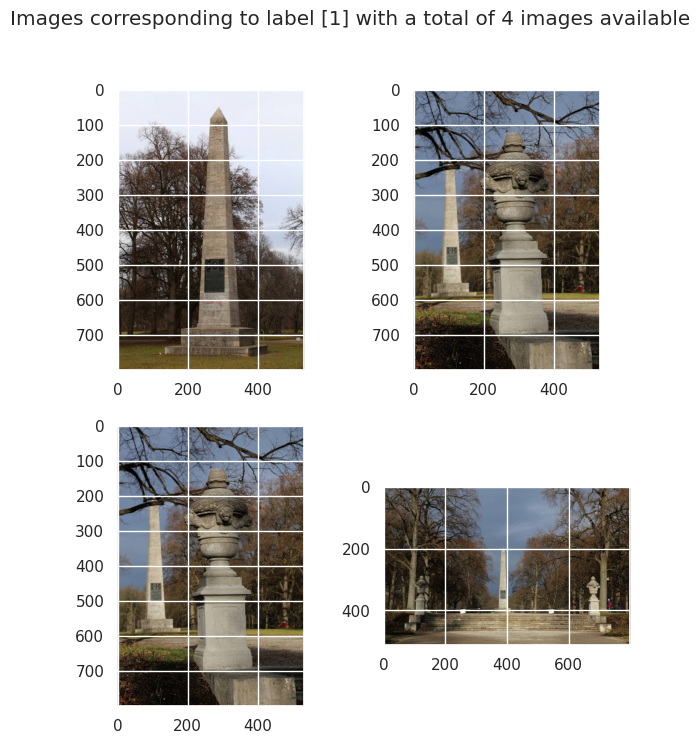

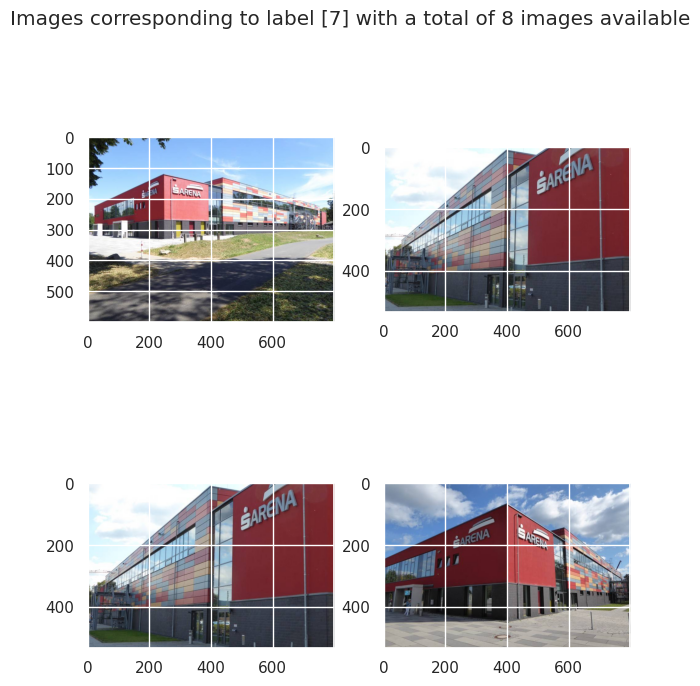

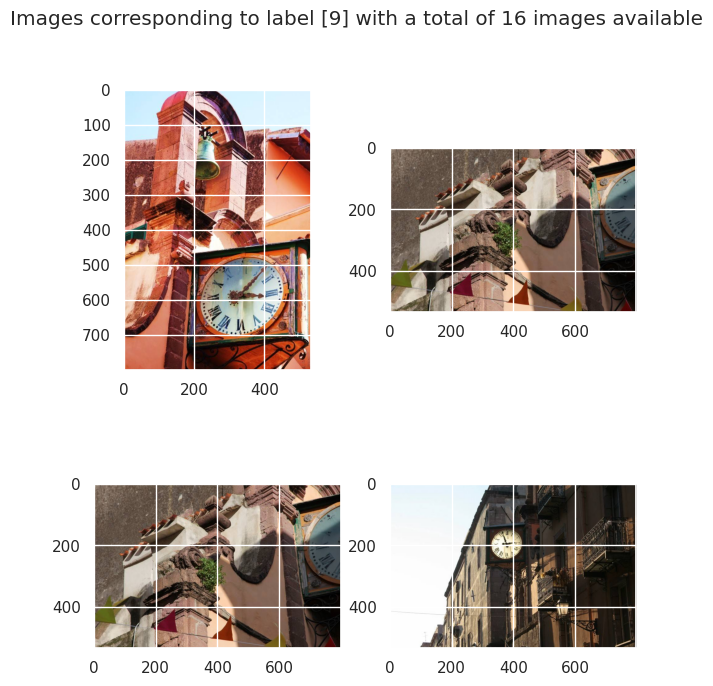

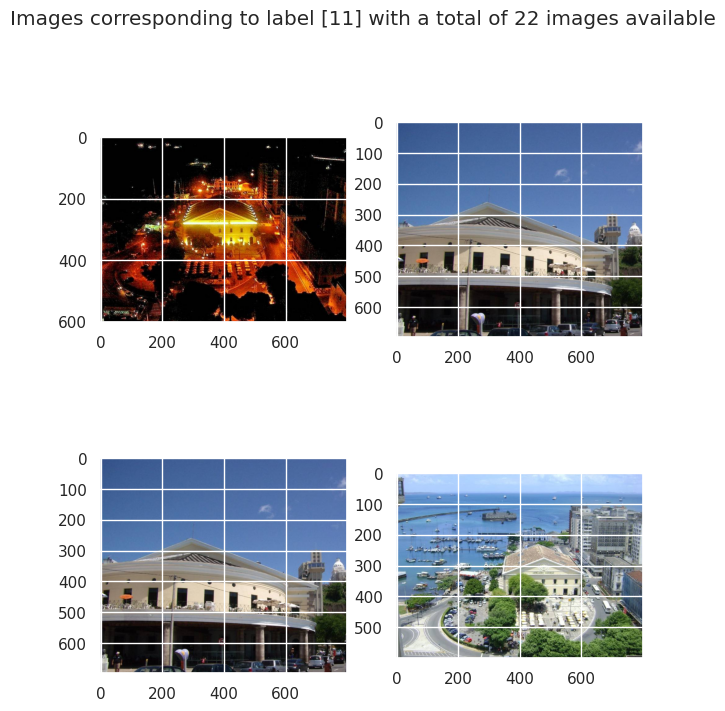

In [136]:
print(f"The data has {train_pathlabel_df['target'].nunique()} unique classes")

for tar in train_pathlabel_df['target'].unique()[:4]: 
    #Subset to just that target 
    label_df = train_pathlabel_df[train_pathlabel_df['target']==tar].reset_index()
    cols = 2
    rows = 2
    fig = plt.figure(figsize = (4*cols - 1, 4.5*rows - 1))
    for c in range(cols):
        for r in range(rows):
            ax = fig.add_subplot(rows, cols, c*rows + r + 1)
            img = mpimg.imread(label_df['image'][c+r])
            ax.imshow(img)#label_df[][c+r])
    fig.suptitle(f"Images corresponding to label [{tar}] with a total of {label_df.shape[0]} images available")
    plt.show()
    plt.close()

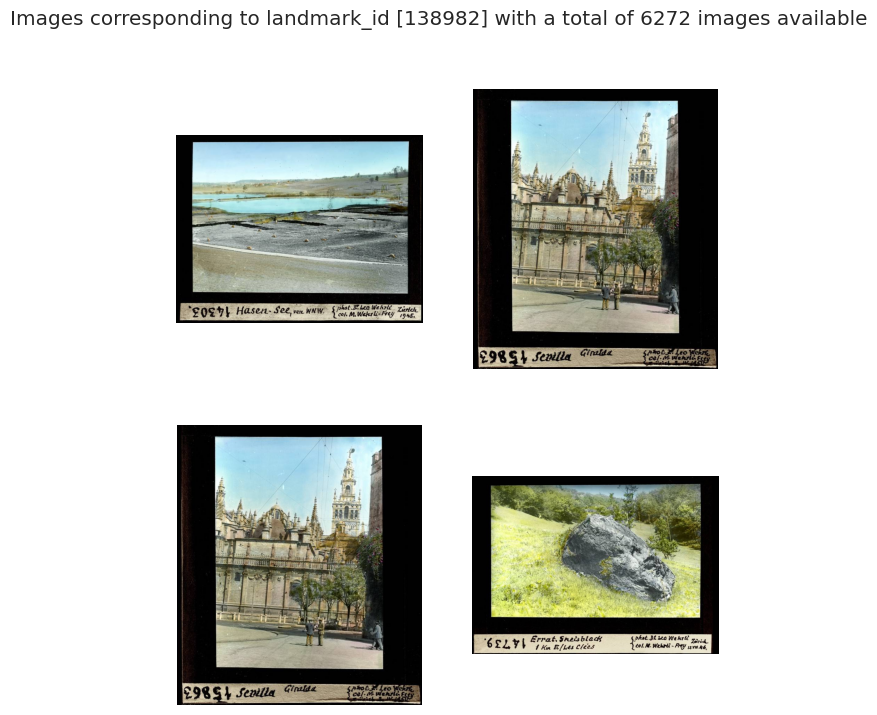

In [138]:
target_landmark_id = 138982

# Filter the DataFrame for the specific target landmark ID
label_df = train_pathlabel_df[train_pathlabel_df['target'] == target_landmark_id].reset_index()

# Set up grid for plotting images
cols = 2
rows = 2
fig = plt.figure(figsize = (4*cols - 1, 4.5*rows - 1))

# Loop through the images and plot
for c in range(cols):
    for r in range(rows):
        ax = fig.add_subplot(rows, cols, c*rows + r + 1)
        if c + r < len(label_df):  # Ensure we don't go out of bounds
            img = mpimg.imread(label_df['image'][c+r])
            ax.imshow(img)
            ax.axis('off')  # Hide axes for better visualization
        else:
            ax.axis('off')  # If there are fewer images, hide the empty subplot

# Title for the figure
fig.suptitle(f"Images corresponding to landmark_id [{target_landmark_id}] with a total of {label_df.shape[0]} images available")

# Show the images
plt.show()
plt.close()

Image 0006f34cf361f69c size: 73.18 KB (0.07 MB)
Image 0010089264bb0573 size: 81.41 KB (0.08 MB)
Image 0010089264bb0573 size: 81.41 KB (0.08 MB)
Image 001734558e2fde76 size: 90.47 KB (0.09 MB)


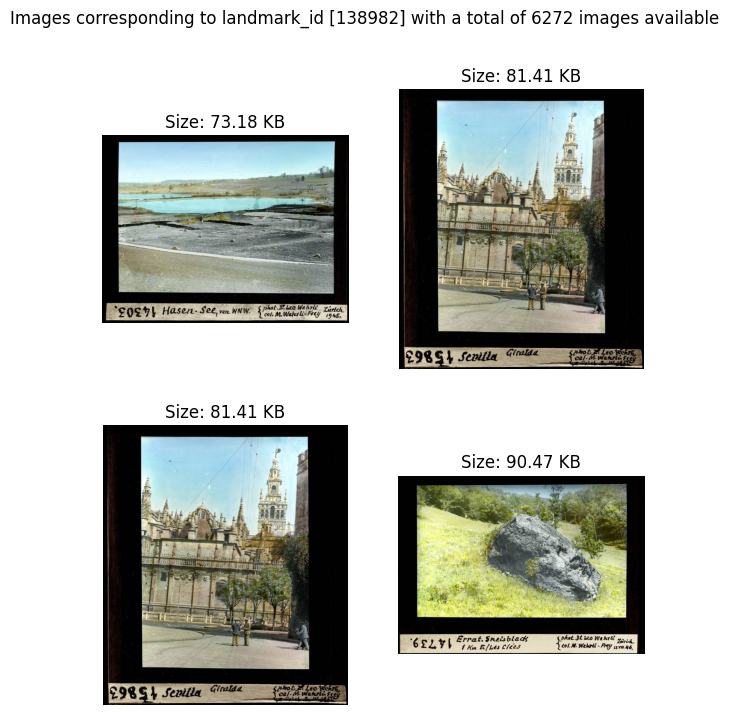

In [11]:
import os

target_landmark_id = 138982

# Filter the DataFrame for the specific target landmark_id
label_df = train_df[train_df['landmark_id'] == target_landmark_id].reset_index()

# Set up grid for plotting images
cols = 2
rows = 2
fig = plt.figure(figsize=(4 * cols - 1, 4.5 * rows - 1))

# Loop through the images and plot
for c in range(cols):
    for r in range(rows):
        ax = fig.add_subplot(rows, cols, c * rows + r + 1)
        if c + r < len(label_df):  # Ensure we don't go out of bounds
            img_id = label_df['id'][c + r]  # Image ID from the DataFrame
            
            # Construct the image file path dynamically using the first three characters of the image ID
            first_char, second_char, third_char = img_id[:3]
            img_full_path = f'/kaggle/input/landmark-recognition-2021/train/{first_char}/{second_char}/{third_char}/{img_id}.jpg'
            
            # Get the image size in bytes and convert it to KB/MB
            try:
                img_size_bytes = os.path.getsize(img_full_path)
                img_size_kb = img_size_bytes / 1024  # Convert to KB
                img_size_mb = img_size_kb / 1024  # Convert to MB

                # Print the image size in the console
                print(f"Image {img_id} size: {img_size_kb:.2f} KB ({img_size_mb:.2f} MB)")

                # Read and display the image
                img = mpimg.imread(img_full_path)
                ax.imshow(img)
                ax.set_title(f"Size: {img_size_kb:.2f} KB")  # Show the size on the image
                ax.axis('off')  # Hide axes for better visualization
            except FileNotFoundError:
                ax.axis('off')  # If the image is not found, hide the subplot
                print(f"Image {img_id} not found at {img_full_path}")

        else:
            ax.axis('off')  # If there are fewer images, hide the empty subplot

# Title for the figure
fig.suptitle(f"Images corresponding to landmark_id [{target_landmark_id}] with a total of {label_df.shape[0]} images available")

# Show the images
plt.show()
plt.close()

Image 00061e23ce736fa9 size: 36.51 KB (0.04 MB)
Image 0060992db5cc819f size: 38.44 KB (0.04 MB)
Image 0060992db5cc819f size: 38.44 KB (0.04 MB)
Image 008315aa634e14b9 size: 59.78 KB (0.06 MB)


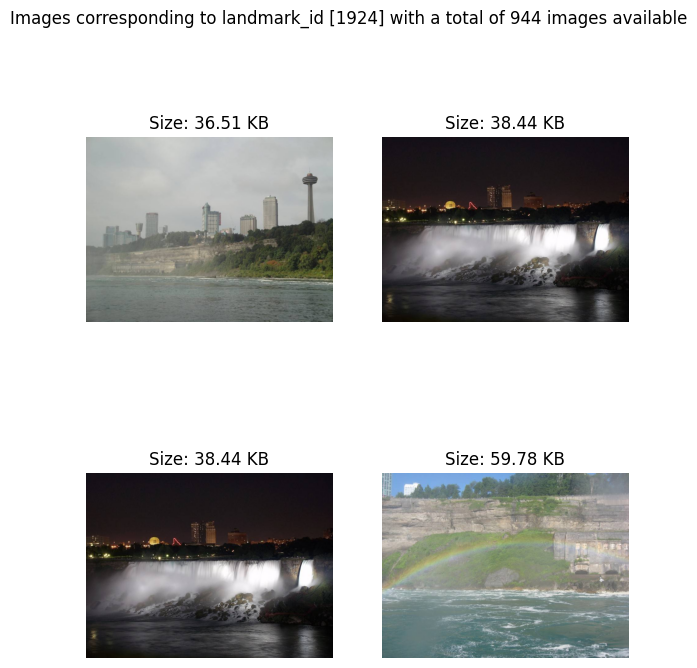

In [12]:
target_landmark_id = 1924

# Filter the DataFrame for the specific target landmark_id
label_df = train_df[train_df['landmark_id'] == target_landmark_id].reset_index()

# Set up grid for plotting images
cols = 2
rows = 2
fig = plt.figure(figsize=(4 * cols - 1, 4.5 * rows - 1))

# Loop through the images and plot
for c in range(cols):
    for r in range(rows):
        ax = fig.add_subplot(rows, cols, c * rows + r + 1)
        if c + r < len(label_df):  # Ensure we don't go out of bounds
            img_id = label_df['id'][c + r]  # Image ID from the DataFrame
            
            # Construct the image file path dynamically using the first three characters of the image ID
            first_char, second_char, third_char = img_id[:3]
            img_full_path = f'/kaggle/input/landmark-recognition-2021/train/{first_char}/{second_char}/{third_char}/{img_id}.jpg'
            
            # Get the image size in bytes and convert it to KB/MB
            try:
                img_size_bytes = os.path.getsize(img_full_path)
                img_size_kb = img_size_bytes / 1024  # Convert to KB
                img_size_mb = img_size_kb / 1024  # Convert to MB

                # Print the image size in the console
                print(f"Image {img_id} size: {img_size_kb:.2f} KB ({img_size_mb:.2f} MB)")

                # Read and display the image
                img = mpimg.imread(img_full_path)
                ax.imshow(img)
                ax.set_title(f"Size: {img_size_kb:.2f} KB")  # Show the size on the image
                ax.axis('off')  # Hide axes for better visualization
            except FileNotFoundError:
                ax.axis('off')  # If the image is not found, hide the subplot
                print(f"Image {img_id} not found at {img_full_path}")

        else:
            ax.axis('off')  # If there are fewer images, hide the empty subplot

# Title for the figure
fig.suptitle(f"Images corresponding to landmark_id [{target_landmark_id}] with a total of {label_df.shape[0]} images available")

# Show the images
plt.show()
plt.close()

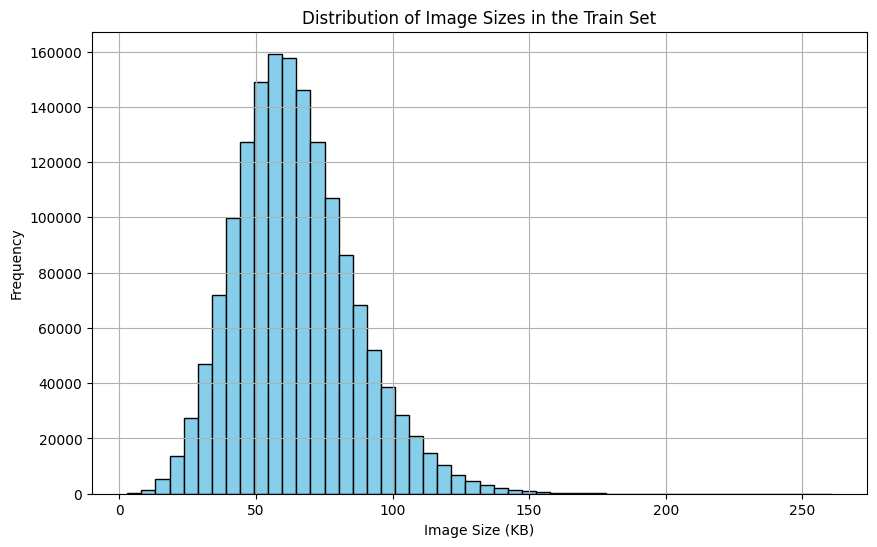

In [13]:
image_sizes = []

# Loop through the image IDs in the DataFrame and calculate sizes
for img_id in train_df['id']:
    # Construct the image file path dynamically using the first three characters of the image ID
    first_char, second_char, third_char = img_id[:3]
    img_full_path = f'/kaggle/input/landmark-recognition-2021/train/{first_char}/{second_char}/{third_char}/{img_id}.jpg'

    try:
        # Get the image size in bytes
        img_size_bytes = os.path.getsize(img_full_path)
        image_sizes.append(img_size_bytes / 1024)  # Convert size to KB
    except FileNotFoundError:
        print(f"Image {img_id} not found at {img_full_path}")
        image_sizes.append(0)  # If image not found, append 0 (you can handle this case as needed)

# Plot the histogram of image sizes
plt.figure(figsize=(10, 6))
plt.hist(image_sizes, bins=50, color='skyblue', edgecolor='black')
plt.title('Distribution of Image Sizes in the Train Set')
plt.xlabel('Image Size (KB)')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

In [9]:
counts_df = pd.DataFrame(train_df[['landmark_id']].value_counts().reset_index())
counts_df.columns = ['Landmark', 'Count']
counts_df.sort_values('Count', ascending=False, inplace=True)
print(counts_df.head())

fig = go.Figure(data = [go.Bar(x = counts_df[:20].index,
                              y=counts_df[:20]['Count'],
                              text=counts_df[:20]['Count'],
                              textposition = 'outside')])
fig.update_layout(title="Image counts across top 20 landmarks",
                 xaxis_title = "Landmark id",
                 yaxis_title = "Count of images")
fig.update_xaxes(ticktext= counts_df[:20]['Landmark'],
                tickvals = counts_df[:20].index)
fig.show()


   Landmark  Count
0    138982   6272
1    126637   2231
2     20409   1758
3     83144   1741
4    113209   1135


In [142]:
counts_df['Bin'] = np.where((counts_df['Count']<=10), "(0, 10]", "Rest")
counts_df['Bin'] = np.where((counts_df['Count']>10) & (counts_df['Count']<=20), "(10, 20]", counts_df['Bin'])
counts_df['Bin'] = np.where((counts_df['Count']>20) & (counts_df['Count']<=30), "(20, 30]", counts_df['Bin'])
counts_df['Bin'] = np.where((counts_df['Count']>30) & (counts_df['Count']<=50), "(30, 50]", counts_df['Bin'])
counts_df['Bin'] = np.where((counts_df['Count']>50) & (counts_df['Count']<=70), "(50, 70]", counts_df['Bin'])
counts_df['Bin'] = np.where((counts_df['Count']>70) & (counts_df['Count']<=100), "(70, 100]", counts_df['Bin'])
counts_df['Bin'] = np.where((counts_df['Count']>100) & (counts_df['Count']<=150), "(100, 150]", counts_df['Bin'])
# counts_df['Bin'] = np.where((counts_df['Count']>=20) & (counts_df['Count']<30), "Bin 3: 20-30", counts_df['Bin'])
bin_df = counts_df.groupby('Bin')['Count'].count().reset_index()
bin_df['Bin'] = bin_df['Bin'].astype('str')
print(bin_df)


          Bin  Count
0     (0, 10]  44646
1    (10, 20]  16974
2  (100, 150]   1092
3    (20, 30]   7213
4    (30, 50]   6148
5    (50, 70]   2618
6   (70, 100]   1743
7        Rest    879


In [143]:
fig = go.Figure(data = [go.Bar(x=bin_df['Bin'],
                               y=bin_df['Count'],
                               text = bin_df['Count'],
                              textposition = 'outside')])
fig.update_layout(title='Ímage counts across bins',
                  xaxis_title = "Bin/interval of image counts per landmark",
                 yaxis_title = "Count of images in bin")
# fig.update_xaxes('Bins/intervals of image counts')
fig.show()

44,646 landmarks have at least 10 images.

Only 879 landmarks have more than 100 images


# Test Set #

There are 117,577 images in the test set.

And some of the images are not landmark-related, portrait of a man,etc

Image 00016575233bc956 not found at /kaggle/input/landmark-recognition-2021/test/0/0/0/00016575233bc956.jpg
Image 0001aadbcd8cb923 not found at /kaggle/input/landmark-recognition-2021/test/0/0/0/0001aadbcd8cb923.jpg
Image 0001aadbcd8cb923 not found at /kaggle/input/landmark-recognition-2021/test/0/0/0/0001aadbcd8cb923.jpg
Image 0002c06b2440a5f9 not found at /kaggle/input/landmark-recognition-2021/test/0/0/0/0002c06b2440a5f9.jpg


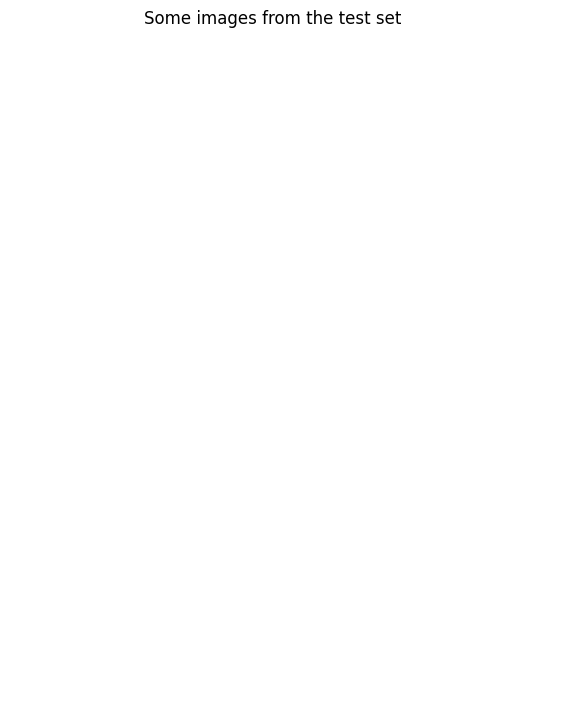

In [14]:
test_df = pd.read_csv('/kaggle/input/mappings-gldv2/test.csv')

# Set up grid for plotting images
cols = 2
rows = 2
fig = plt.figure(figsize=(4 * cols - 1, 4.5 * rows - 1))

# Loop through the images and plot
for c in range(cols):
    for r in range(rows):
        ax = fig.add_subplot(rows, cols, c * rows + r + 1)
        if c + r < len(test_df):  # Ensure we don't go out of bounds
            img_id = test_df['id'][c + r]  # Image ID from the DataFrame
            
            # Construct the image file path dynamically using the first three characters of the image ID
            first_char, second_char, third_char = img_id[:3]
            img_full_path = f'/kaggle/input/landmark-recognition-2021/test/{first_char}/{second_char}/{third_char}/{img_id}.jpg'
            
            # Read and display the image
            try:
                img = mpimg.imread(img_full_path)
                ax.imshow(img)
                ax.set_title(f"ID: {img_id}")  # Show the image ID on the title
                ax.axis('off')  # Hide axes for better visualization
            except FileNotFoundError:
                ax.axis('off')  # If the image is not found, hide the subplot
                print(f"Image {img_id} not found at {img_full_path}")

        else:
            ax.axis('off')  # If there are fewer images, hide the empty subplot

# Title for the figure
fig.suptitle(f"Some images from the test set")

# Show the images
plt.show()
plt.close()

In [ ]:
test_df = pd.read_csv('/kaggle/input/mappings-gldv2/test.csv')

# Set up grid for plotting images
cols = 2
rows = 2
fig = plt.figure(figsize=(4 * cols - 1, 4.5 * rows - 1))

# Loop through the images and plot
for c in range(cols):
    for r in range(rows):
        ax = fig.add_subplot(rows, cols, c * rows + r + 1)
        if c + r < len(test_df):  # Ensure we don't go out of bounds
            img_id = test_df['id'][c + r]  # Image ID from the DataFrame
            
            # Construct the image file path dynamically using the first three characters of the image ID
            first_char, second_char, third_char = img_id[:3]
            img_full_path = f'/kaggle/input/landmark-recognition-2021/test/{first_char}/{second_char}/{third_char}/{img_id}.jpg'
            
            # Print the path to debug the issue
            print(f"Trying to load image: {img_full_path}")
            
            # Read and display the image
            try:
                img = mpimg.imread(img_full_path)
                ax.imshow(img)
                ax.set_title(f"ID: {img_id}")  # Show the image ID on the title
                ax.axis('off')  # Hide axes for better visualization
            except FileNotFoundError:
                ax.axis('off')  # If the image is not found, hide the subplot
                print(f"Image {img_id} not found at {img_full_path}")

        else:
            ax.axis('off')  # If there are fewer images, hide the empty subplot

# Title for the figure
fig.suptitle(f"Some images from the test set")

# Show the images
plt.show()
plt.close()